# FRET analysis - FLIM

This is a script to analyze FRET from 2D FLIM  images of cells transfected with different force sensors.
As controls, we use a donor only construct.

All images were acquired on our FCS 1 photon confocal microscope.


This script is meant to analyze files in an automatic way (nuclei segmentation, mask detection for the NE area, fluorescence intensity measurements in different channels, formatting of data, graphical representation...

## Workflow
Still images and time-lapse have to be analyzed separately, otherwise it is a mess...
I will then stitch all the times and values together.

**Still images:**
1. open files
2. segment cells - find bounding boxes
3. segment NE
4. Life time analysis => create a mask on the NE
5. draw a histogram of the Donor lifetime
6. save data along with metadata (condition, time...)

**Timelapse:**
1. open reference file
2. segment cells - find bounding boxes
3. for each bounding box, open the stack of images, segment NE and analyze the lifetime as previously.
4. save data along with metadata (condition, time, cell#)
5. build time curves to see the evolution of FLIM as a function of time after addition of hypertonic buffer

This will already be a good start...

----

## Import libraries


In [32]:
%matplotlib inline


In [33]:
from readlif.reader import LifFile
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import skimage.filters
from skimage.io import imread, imshow
from skimage.morphology import area_opening
from skimage.exposure import histogram
from skimage.filters import threshold_otsu
import skimage.measure
from skimage.measure import label, regionprops, regionprops_table
import pandas as pd

#from photutils.detection import DAOStarFinder
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.aperture import CircularAperture
from scipy import ndimage
from astropy.stats import sigma_clipped_stats
#from photutils.datasets import load_star_image
import os
from scipy.spatial.distance import canberra
from scipy.spatial.distance import pdist
import math
from itertools import combinations


import os
import seaborn as sns
from skimage import io, color


---
# Still images

## Define folders and load data


In [68]:
# Define folders
date = '240822'

InputFolder = '/Users/christine/Documents/Data/DynamoLINC/FLIM/FLIM_'+date+'/'
OutputFolder = '/Users/christine/Documents/Data/DynamoLINC/FLIM/FLIM_'+date+'/Results/'

# Extract metadata
#metadata = pd.read_csv(InputFolder+date+'_metadata-static.csv')

ls = os.listdir(InputFolder+'FLIMdata/')
ls.remove('CD158-control-6.tif')
ls.remove('CD158-control-1.tif')
ls.remove('CD153-control-4.tif')

names=[]
files=[]
for i in range(len(ls)):
    before, sep, after = ls[i].partition ('.')
    names.append(before)
    
names

['CD158-control-4',
 'CD158-control-5',
 'CD158-control-7',
 'CD158-control-2',
 'CD158-control-3',
 'CD154-hypertonic-8',
 'CD158-hypertonic-5',
 'CD158-hypertonic-4',
 'CD158-hypertonic-6',
 'CD158-hypertonic-7',
 'CD158-hypertonic-3',
 'CD153-hypertonic-1',
 'CD158-hypertonic-2',
 'CD153-hypertonic-3',
 'CD153-hypertonic-2',
 'CD158-hypertonic-1',
 'CD154-hypertonic-1',
 'CD154-control-3',
 'CD154-control-2',
 'CD158-control-10',
 'CD158-hypertonic-10',
 'CD154-hypertonic-2',
 'CD154-control-1',
 'CD154-hypertonic-3',
 'CD153-control-1',
 'CD154-hypertonic-7',
 'CD154-control-5',
 'CD154-control-4',
 'CD154-hypertonic-6',
 'CD153-control-2',
 'CD154-hypertonic-4',
 'CD158-hypertonic-9',
 'CD154-control-6',
 'CD154-control-7',
 'CD158-hypertonic-8',
 'CD154-hypertonic-5',
 'CD153-control-3',
 'CD158-control-8',
 'CD158-control-9']

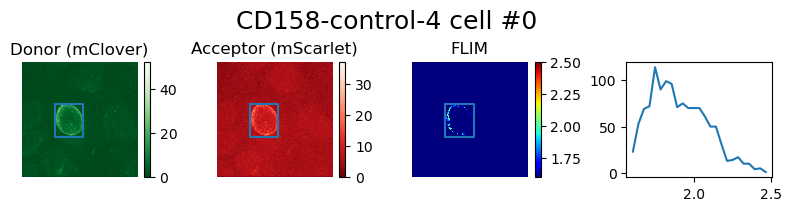

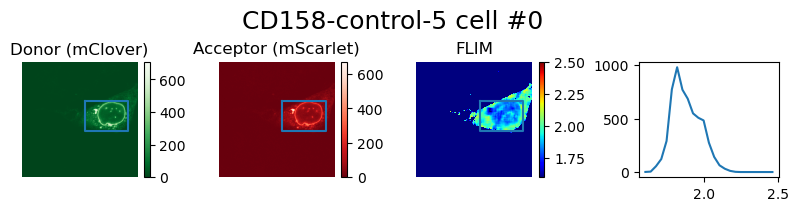

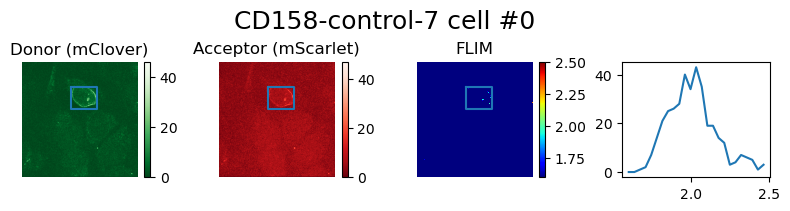

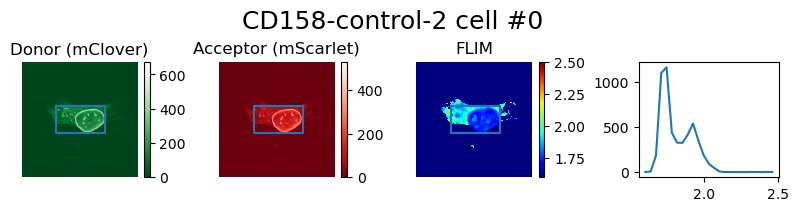

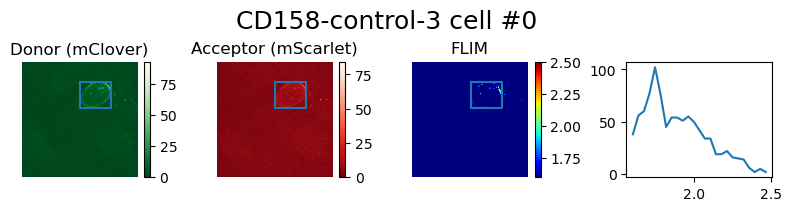

...

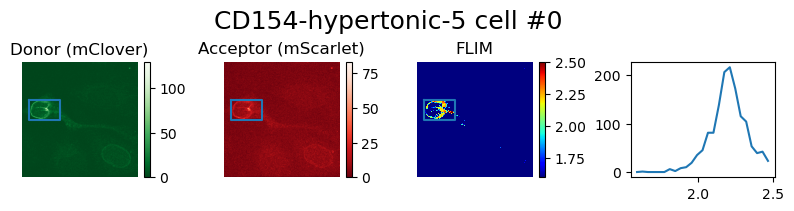

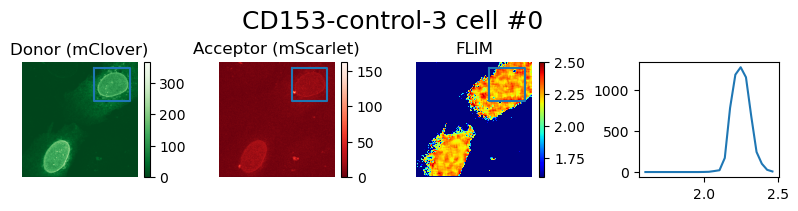

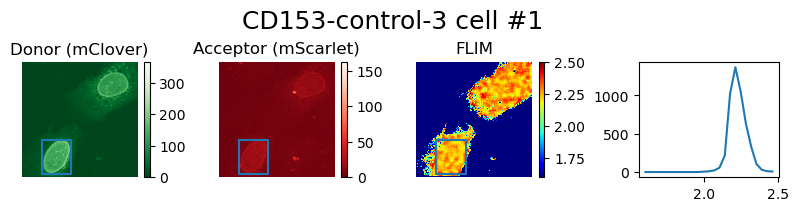

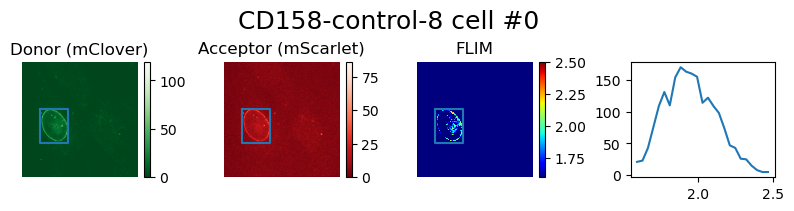

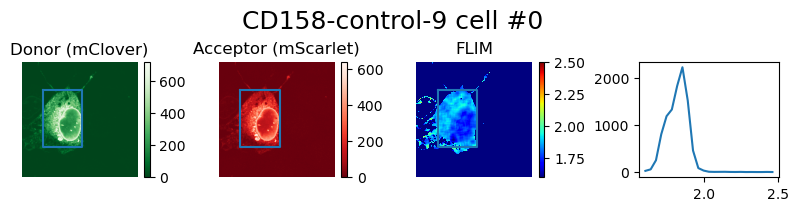

Done!


In [77]:
files = []        # to record the name of the analyzed file
condition = []         # to record the time after the addition of hypertonic buffer
cell = []         # to record the unique identity of the cell
construct = []    # to record the OFS identity
ROIs = []         # to record the bounding box coordinates
tau_mean = []     # to record the mean tau per cell (segmented area)
tau_std = []      # to record the std dev across tau values per cell

minval = 1.6
maxval = 2.5
b=25

# open FLIM file

for n in names:
    
    cell_nb = 0
    
    parts = n.split('-')
    constr = parts[0]
    cond = parts[1]
    
## extract images 
    
    img_FLIM = io.imread(InputFolder+'FLIMdata/'+n+'.tif').astype(float)
    img_D = io.imread(InputFolder+n+'_Ch2.tif').astype(float)
    img_FRET = io.imread(InputFolder+n+'_Ch1.tif').astype(float)
    
    # denoise
    filtered_D = ndimage.gaussian_filter(img_D, sigma=1.5)
    # binarize
    th = skimage.filters.threshold_otsu(filtered_D)
    mask = filtered_D > th
    
    labeled_D, count = skimage.measure.label(mask, connectivity=2,return_num=True)

    props = regionprops_table(labeled_D)
    regions=pd.DataFrame(props)


    # store the bounding boxes coordinates in an array called ROIs (size = count x 4)
    #ROIs = np.zeros((count,4))
    
    
    for p in range(count):
        h = np.zeros(b)
        minx,miny,maxx,maxy = regions.iloc[p,1:5]

        bx=(miny,maxy,maxy,miny,miny)
        by=(minx,minx,maxx,maxx,minx)
        if maxx-minx >35 and maxy-miny>35:
            ROIs.append([minx,maxx,miny,maxy])
            cell.append(cell_nb)
            
            files.append(n)
            construct.append(constr)
            condition.append(cond)
    
            ROI = img_FLIM[minx:maxx,miny:maxy]
            #mask2 = mask[minx:maxx,miny:maxy]
            #ROI = ROI*mask2
            
            histogram, bin_edges = np.histogram(ROI, bins=b, range=(minval, maxval))


            h = h+histogram

            fig, (ax0,ax1,ax2,ax3) = plt.subplots(nrows=1,ncols=4, figsize=(8,2), constrained_layout=True)
            flim=ax2.imshow(img_FLIM, cmap='jet',clim=(minval, maxval))
            #fig.colorbar(flim,ax=ax2, shrink=0.7)
            ax2.set_title('FLIM')
            ax2.axis('off')
            
            don=ax0.imshow(img_D, cmap='Greens_r')
            ax0.set_title('Donor (mClover)')
            ax0.axis('off')

            fret=ax1.imshow(img_FRET, cmap='Reds_r')
            ax1.set_title('Acceptor (mScarlet)')
            ax1.axis('off')
            
            
            bx=(miny,maxy,maxy,miny,miny)
            by=(minx,minx,maxx,maxx,minx)
            
            ax0.plot(bx,by)
            ax1.plot(bx,by)
            ax2.plot(bx,by)

            ax3.plot(bin_edges[0:-1], histogram)
            #plt.savefig('/Users/christine/Documents/Data/DynamoLINC/FLIM/Results/'+f+'_histo.tif')
            #plt.imshow(ROI)
            
            fig.suptitle(n+' cell #'+str(cell_nb), fontsize=18)
            fig.colorbar(flim,ax=ax2)
            fig.colorbar(don,ax=ax0)
            fig.colorbar(fret, ax=ax1)

            plt.savefig(OutputFolder+n+'_cell #'+str(cell_nb)+'_histo.tif')
            plt.savefig(OutputFolder+n+'_cell #'+str(cell_nb)+'_histo.jpg')
            plt.show()
            plt.close()

            cell_nb=cell_nb+1
            
            flatten = ROI.flatten()
            tau_mean.append(np.mean(flatten[flatten!=0]))
            tau_std.append(np.std(flatten[flatten!=0]))

print('Done!')


In [78]:
df = pd.DataFrame()
df['Name'] = files[:]
df['Construct'] = construct[:]
df['Cell#'] = cell[:]
df['ROI coordinates'] = ROIs[:]
df['Condition'] = condition[:]
df['Mean FLIM (ns)'] = tau_mean[:]
df['FLIM std (ns)'] = tau_std[:]

df

,Name,Construct,Cell#,ROI coordinates,Condition,Mean FLIM (ns),FLIM std (ns)
0,CD158-control-4,CD158,0,"[93, 166, 73, 136]",control,1.916008,0.202415
1,CD158-control-5,CD158,0,"[86, 152, 140, 237]",control,1.894068,0.097569
2,CD158-control-7,CD158,0,"[54, 103, 109, 166]",control,2.049340,0.197682
3,CD158-control-2,CD158,0,"[98, 158, 77, 185]",control,1.828419,0.101381
4,CD158-control-3,CD158,0,"[43, 102, 129, 198]",control,1.894643,0.213163
5,CD154-hypertonic-8,CD154,0,"[29, 97, 162, 209]",hypertonic,2.204480,0.132380
6,CD154-hypertonic-8,CD154,1,"[90, 157, 67, 120]",hypertonic,2.175586,0.092322
7,CD158-hypertonic-5,CD158,0,"[96, 184, 144, 205]",hypertonic,1.865832,0.086884
8,CD158-hypertonic-4,CD158,0,"[26, 97, 177, 234]",hypertonic,2.020086,0.180522
9,CD158-hypertonic-6,CD158,0,"[48, 106, 112, 160]",hypertonic,1.798250,0.113116


/opt/anaconda3/envs/npc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:k'` for same effect.
  warnings.warn(msg, FutureWarning)


<Axes: xlabel='Construct', ylabel='Mean FLIM (ns)'>

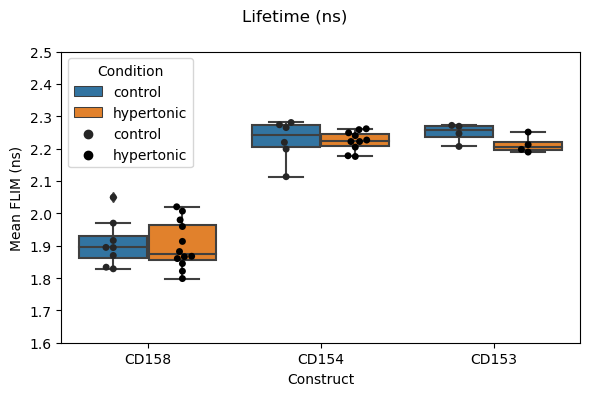

In [79]:
fig, ax = plt.subplots(figsize=(6,4),tight_layout=True)
fig.suptitle('Lifetime (ns)')
ax.set_ylim([minval,maxval])
ax.set_ylabel('Donor lifetime (ns)')
ax.set_xlabel('OFS')


sns.boxplot(x=df['Construct'], y=df['Mean FLIM (ns)'], hue=df['Condition'])
sns.swarmplot(x=df['Construct'], y=df['Mean FLIM (ns)'], hue=df['Condition'],dodge=True,color='k')
    
#ax.legend()
    
    

---

# Time-Lapse


In [38]:
# Extract metadata
metadata = pd.read_csv(InputFolder+date+'_metadata-timelapse.csv')

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


60
0


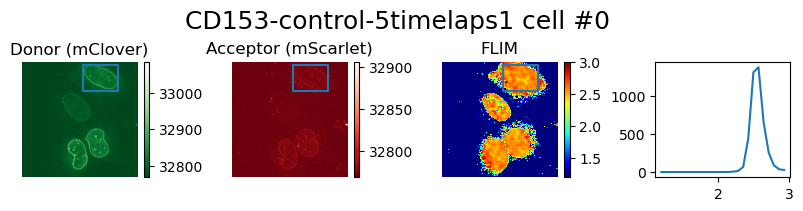

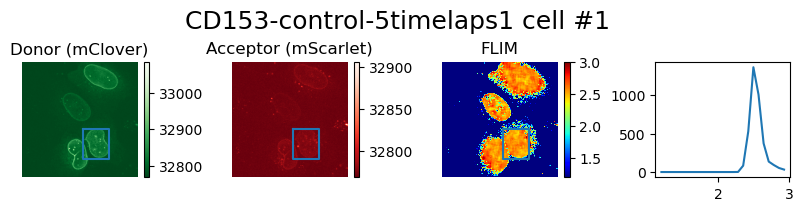

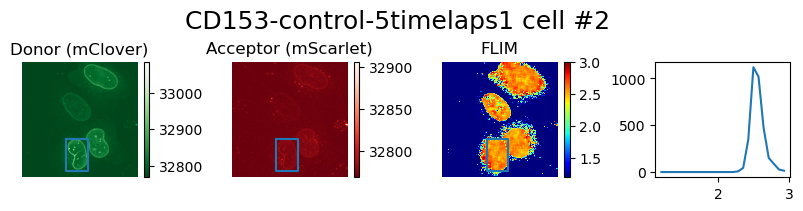

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


1


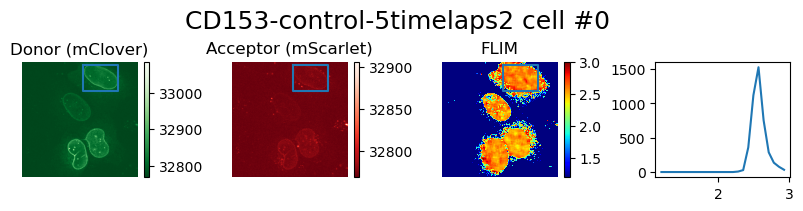

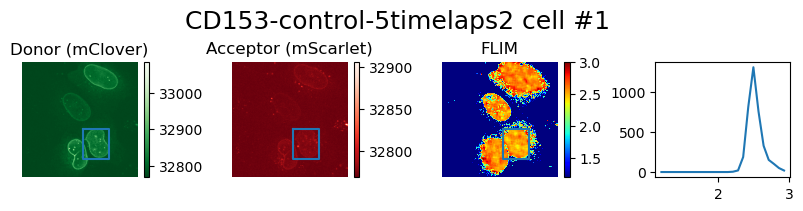

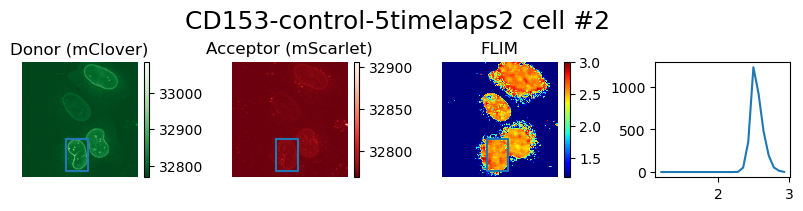

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


2


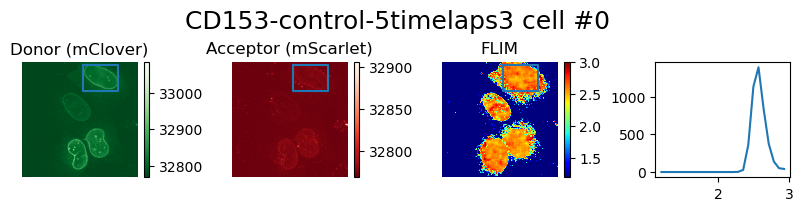

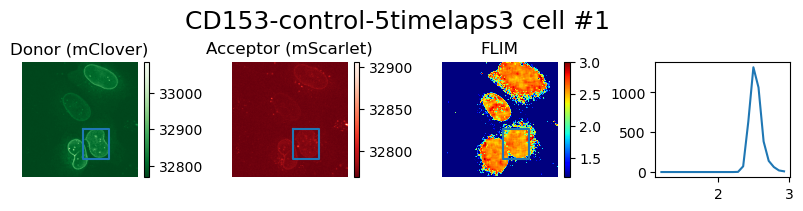

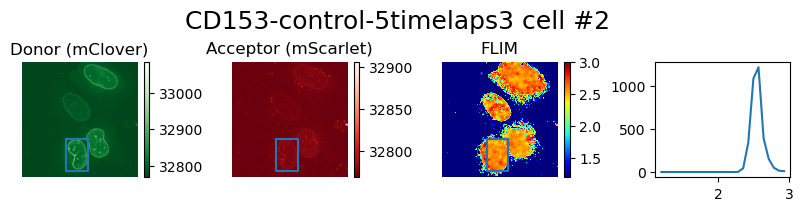

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


3


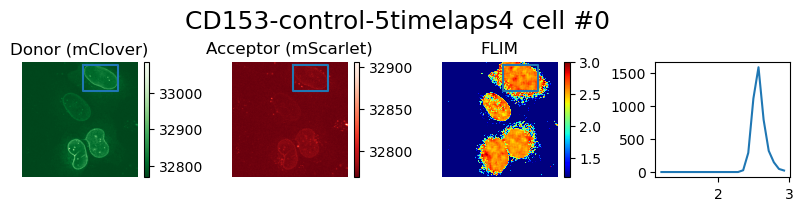

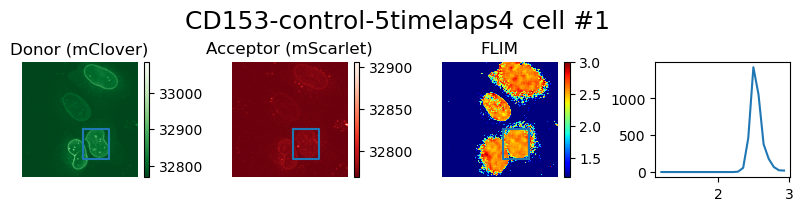

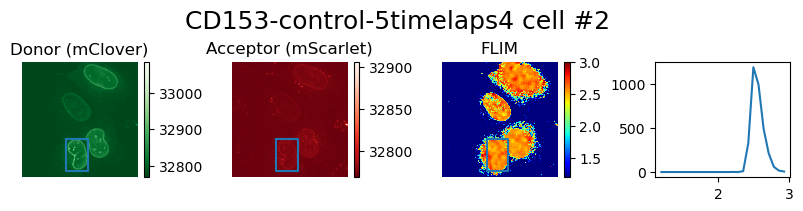

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


4


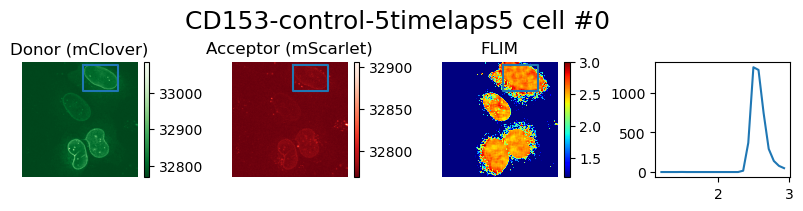

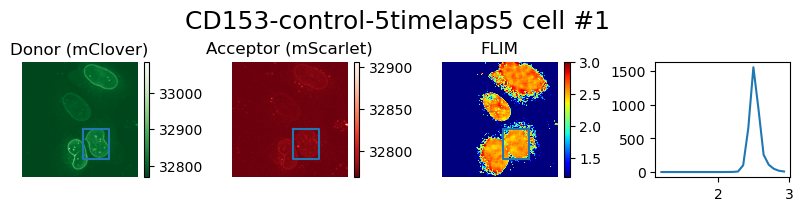

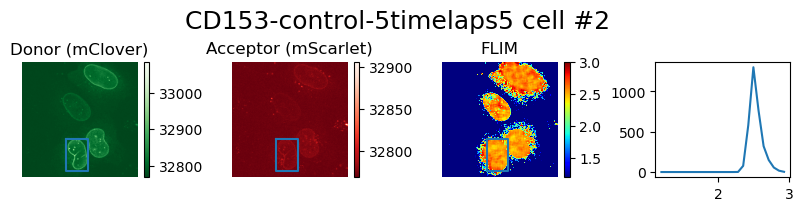

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


5


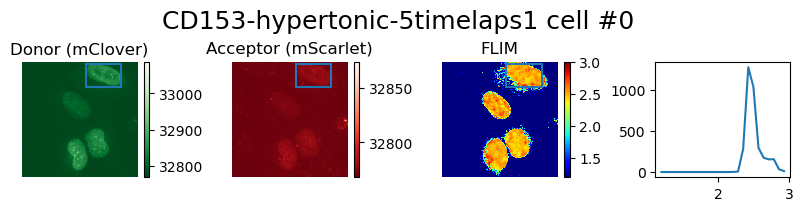

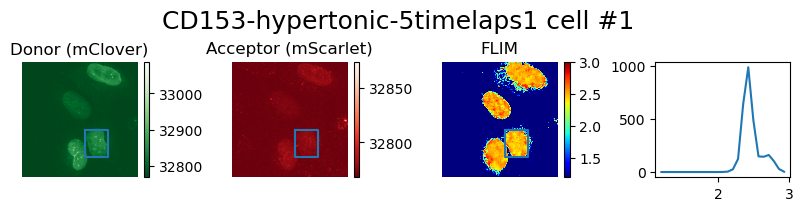

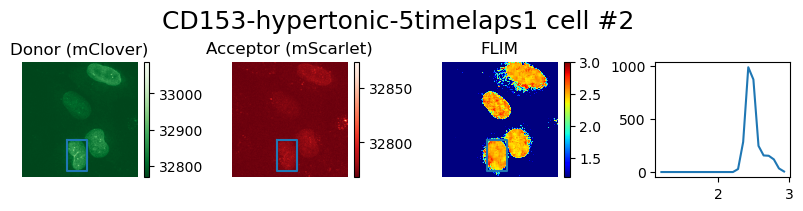

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


6


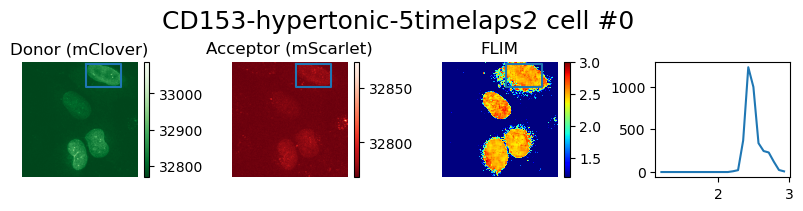

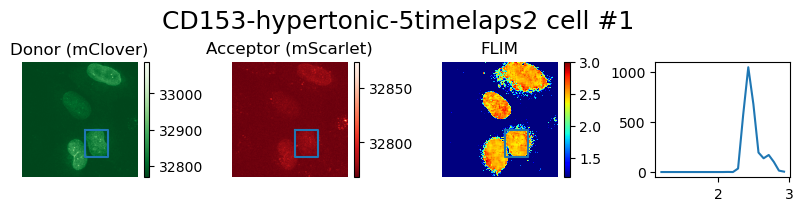

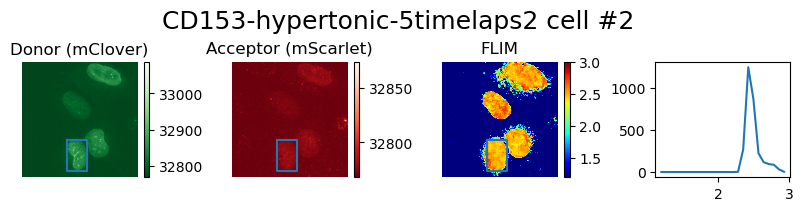

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


7


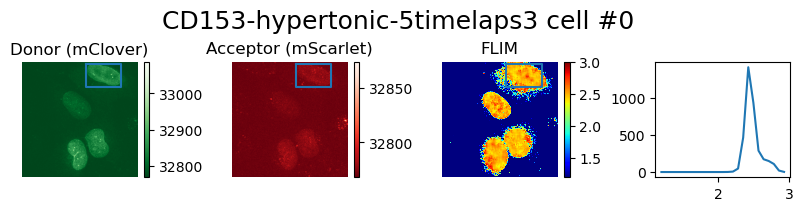

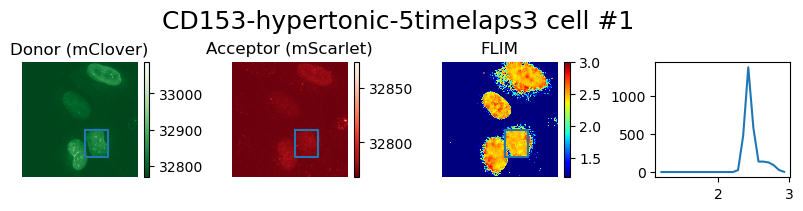

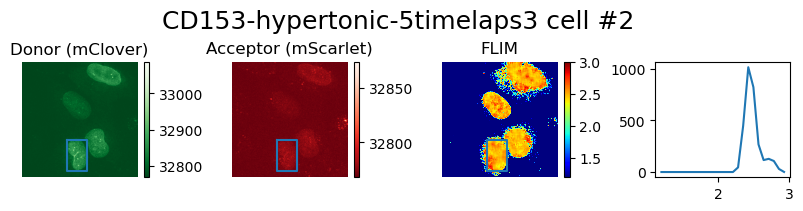

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


8


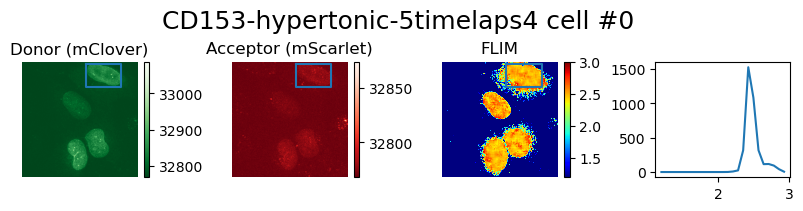

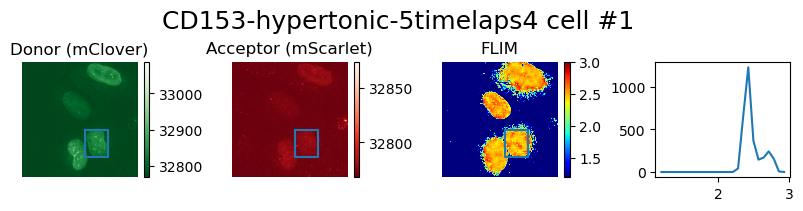

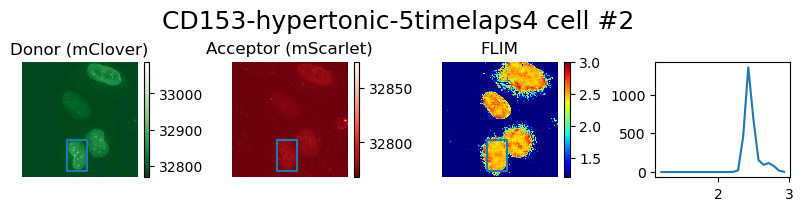

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


9


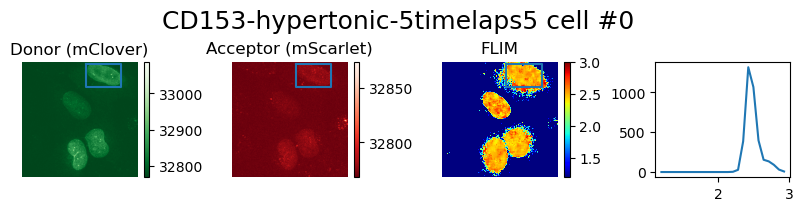

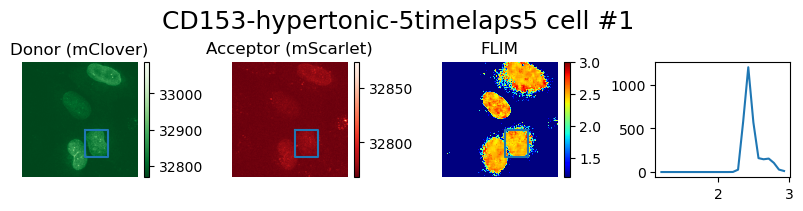

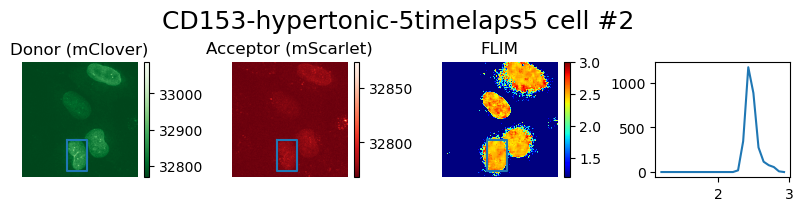

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


10


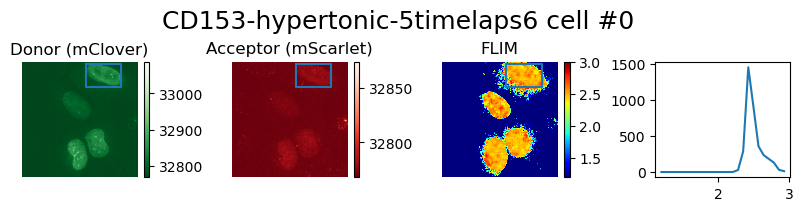

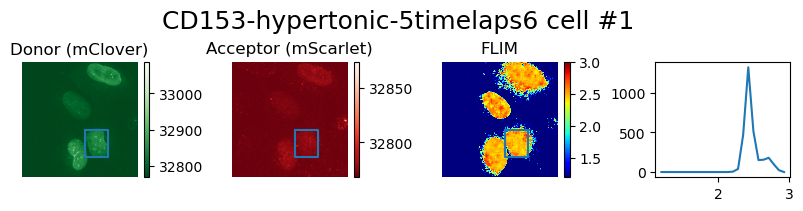

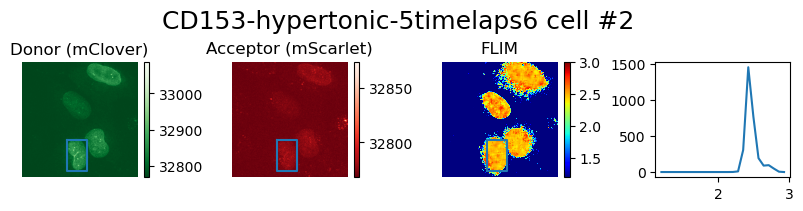

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


11


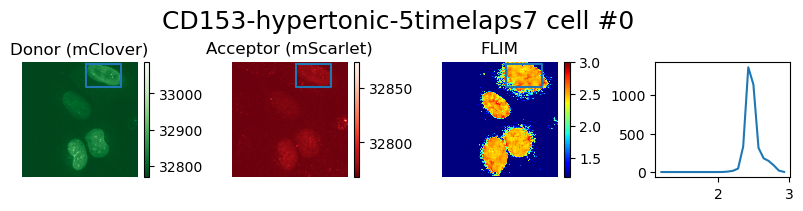

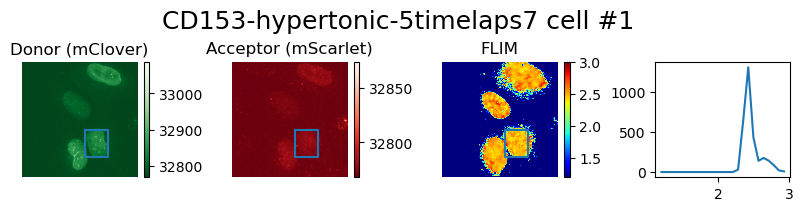

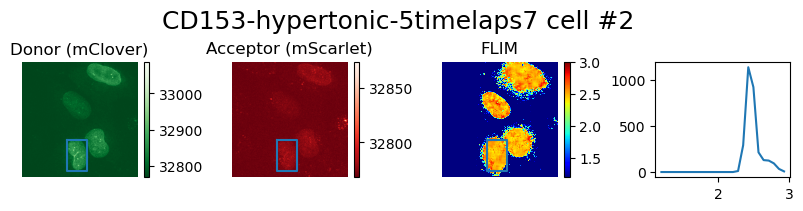

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


12


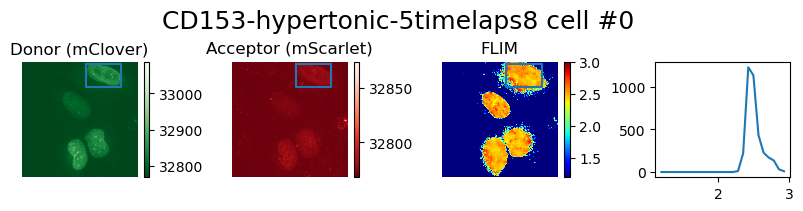

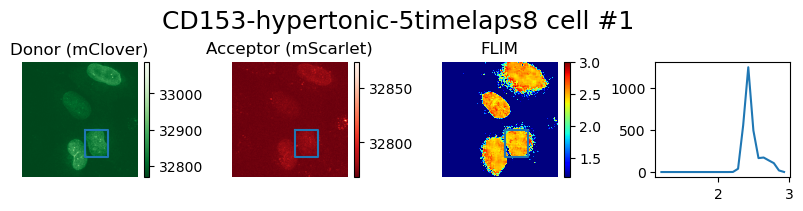

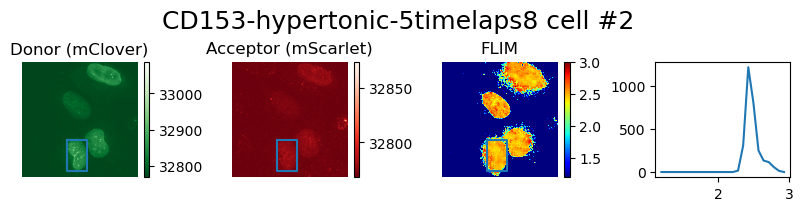

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


13


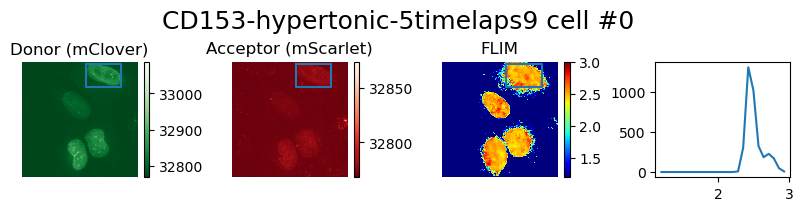

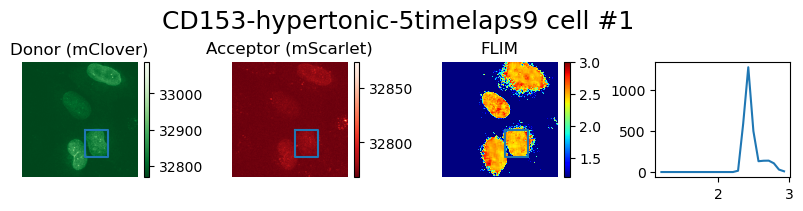

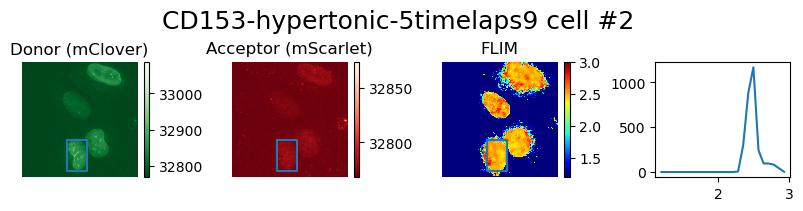

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


14


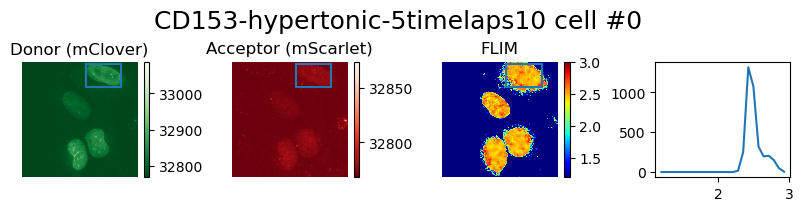

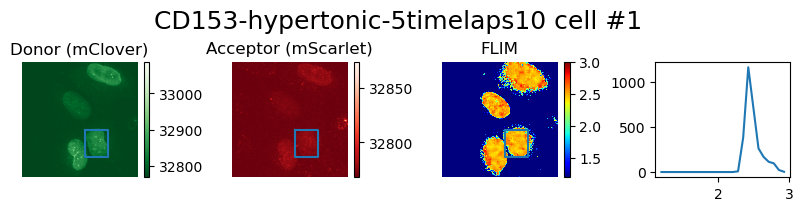

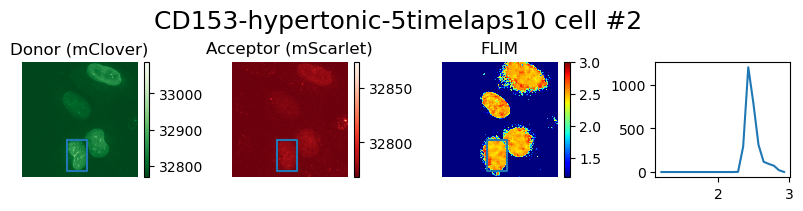

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


15


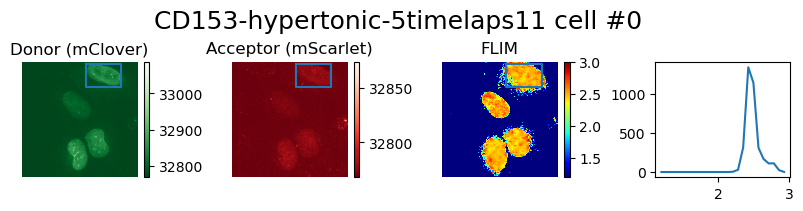

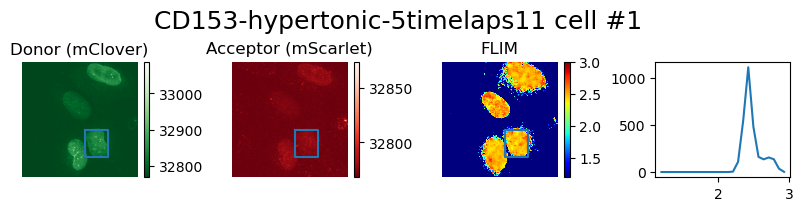

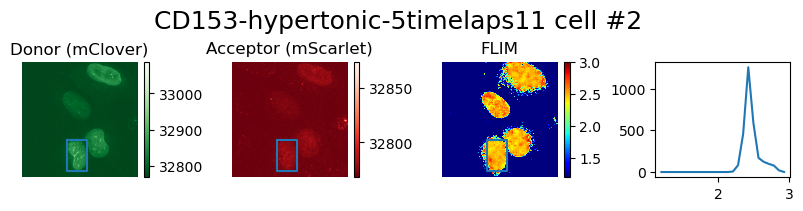

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


16


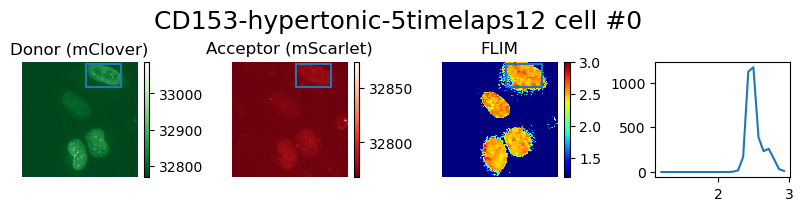

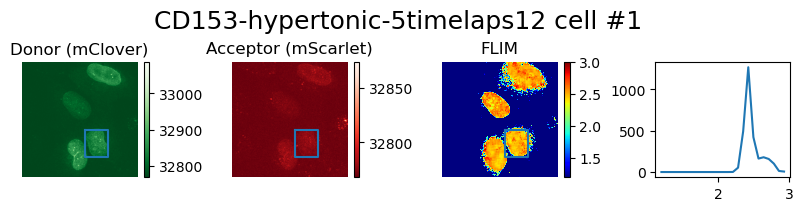

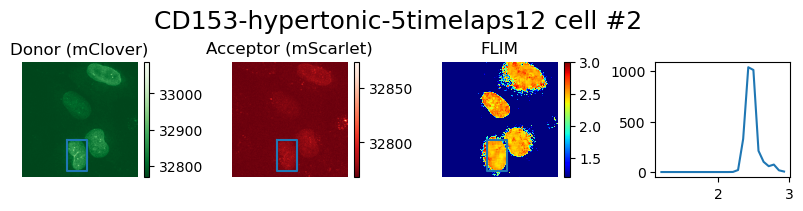

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


17


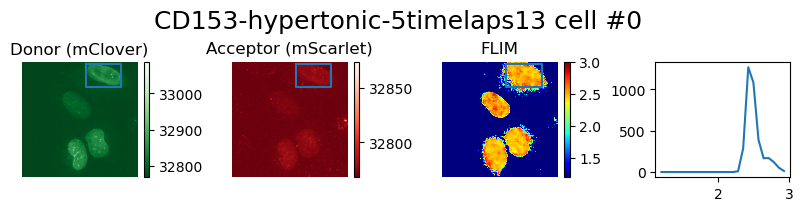

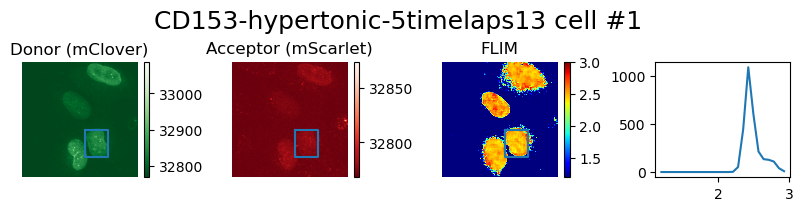

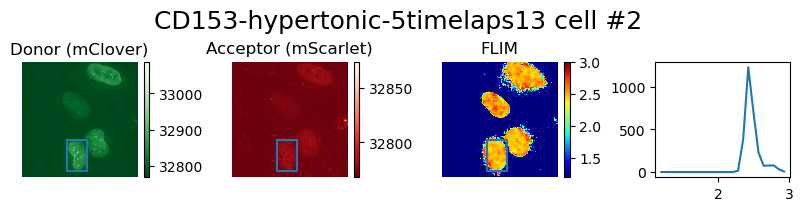

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


18


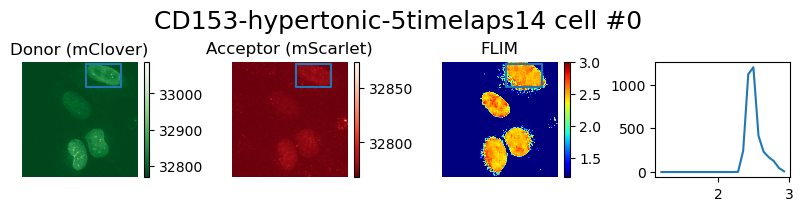

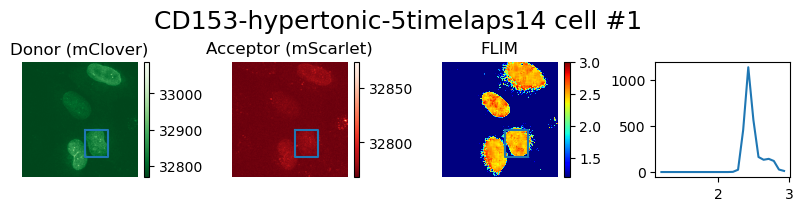

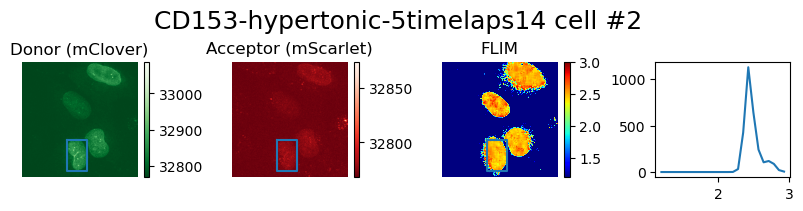

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


19


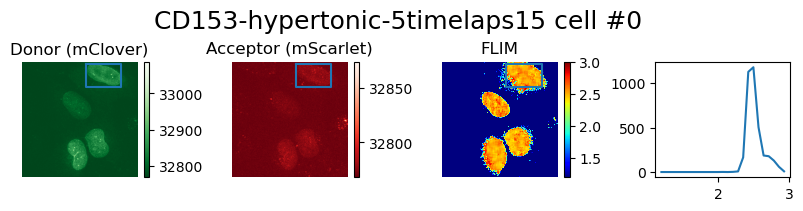

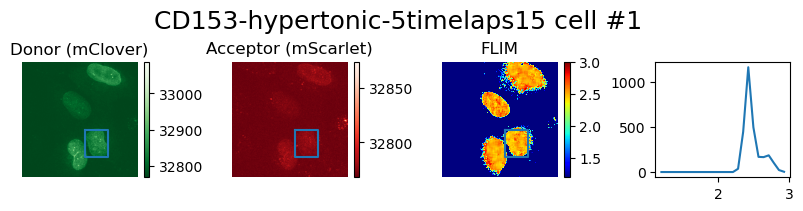

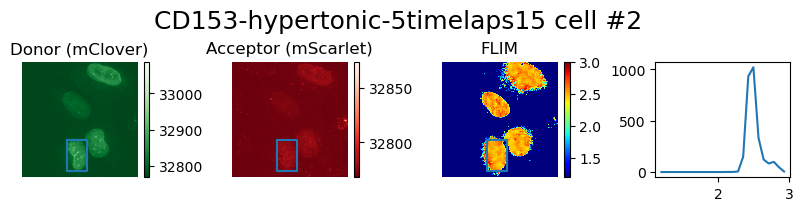

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


20


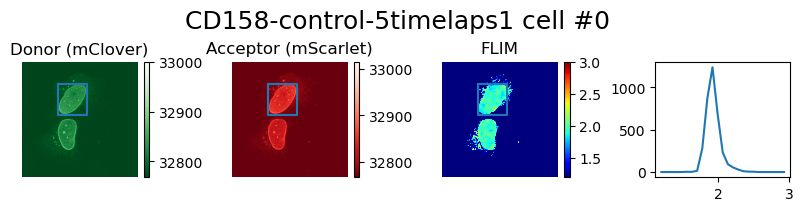

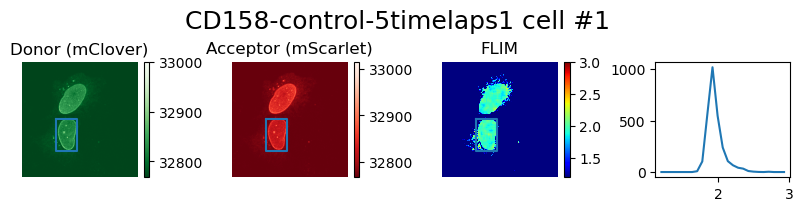

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


21


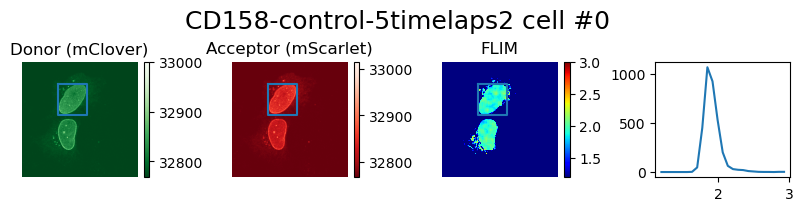

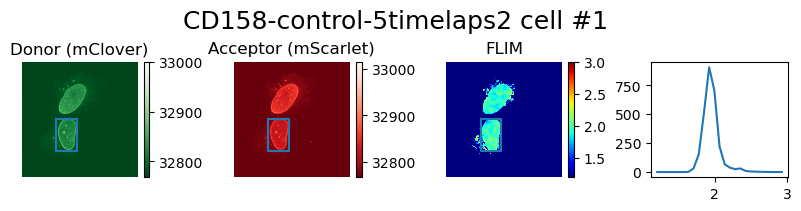

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


22


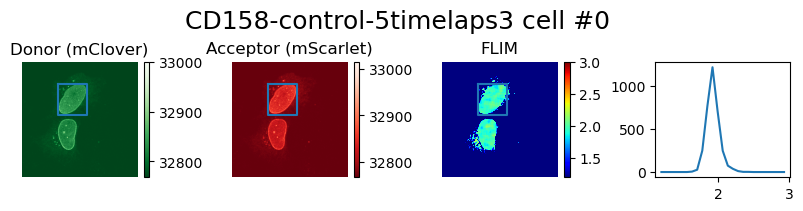

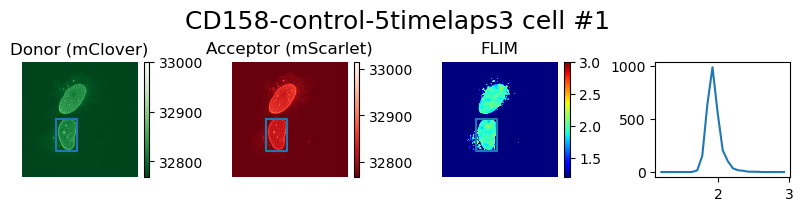

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


23


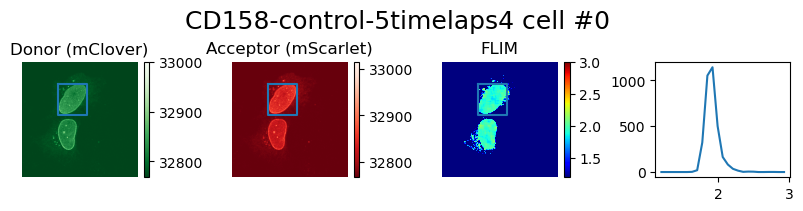

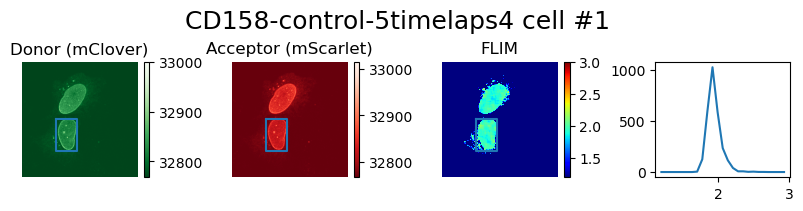

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


24


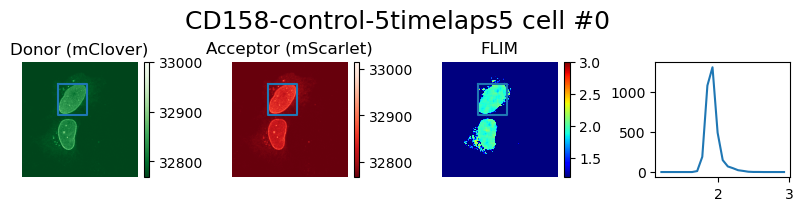

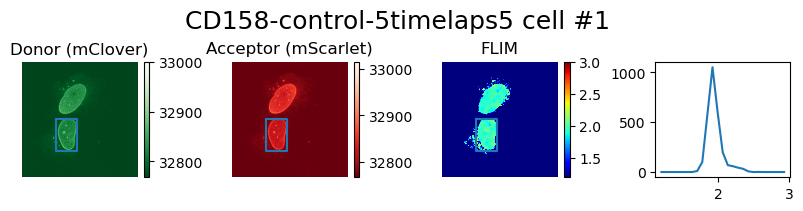

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


25


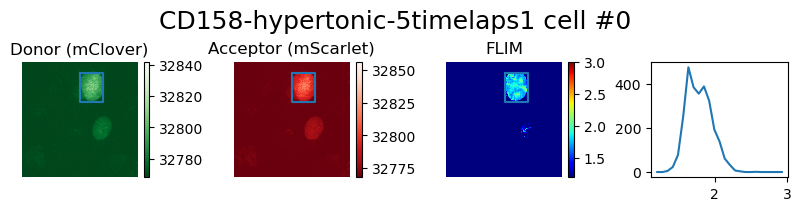

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


26


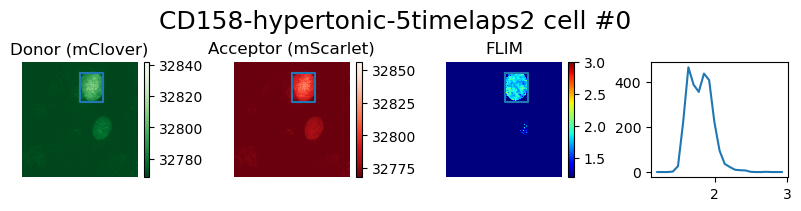

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


27


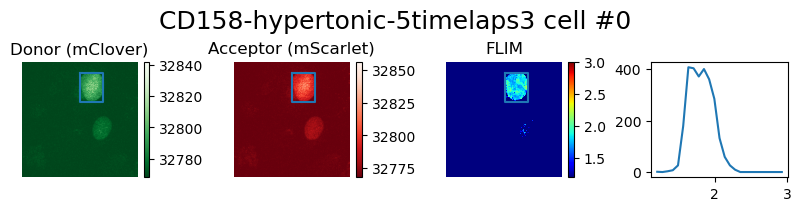

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


28


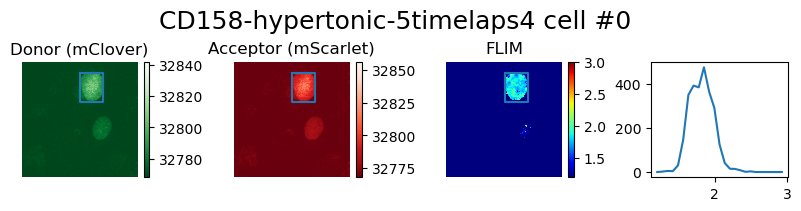

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


29


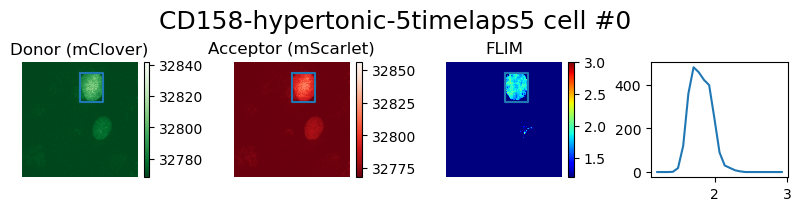

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


30


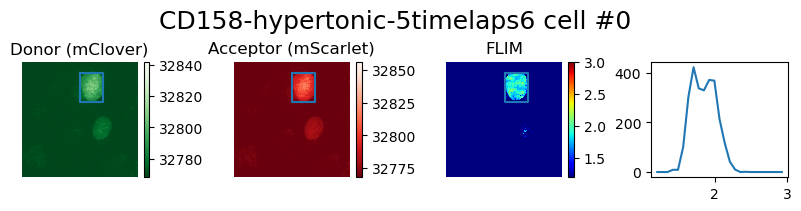

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


31


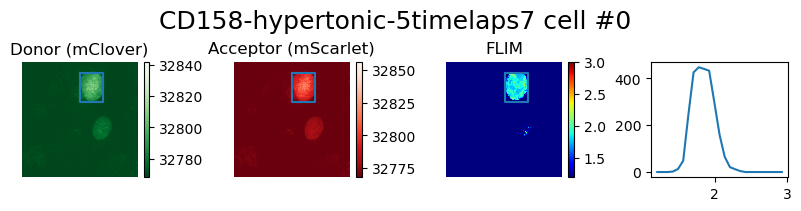

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


32


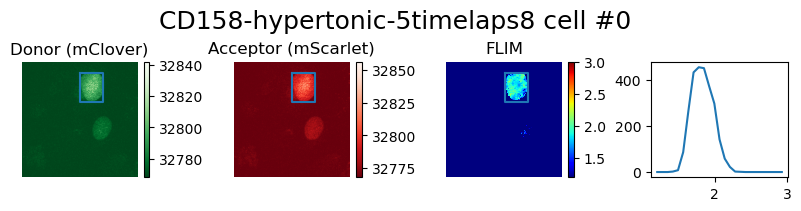

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


33


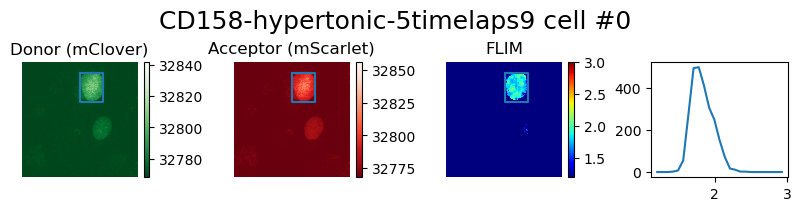

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


34


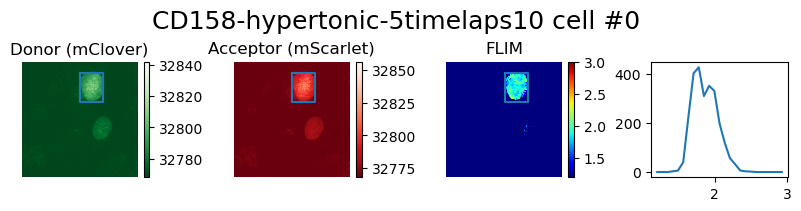

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


35


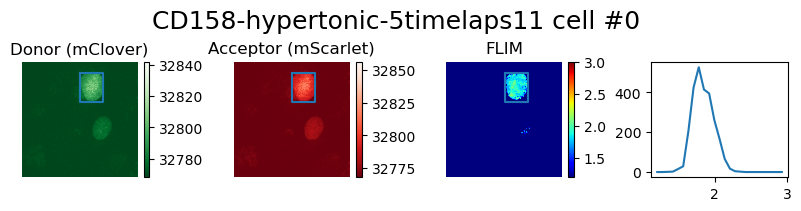

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


36


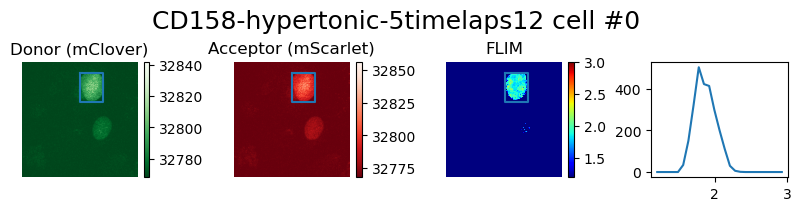

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


37


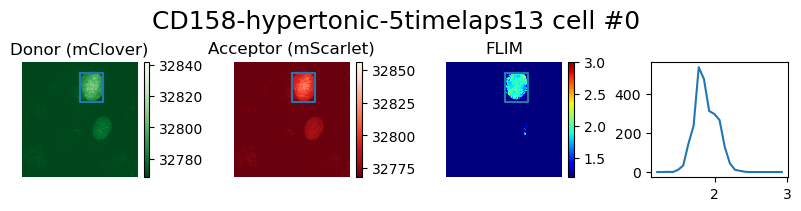

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


38


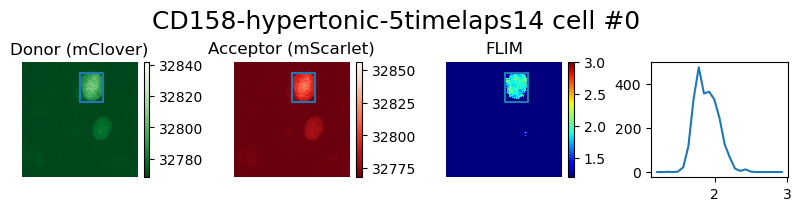

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


39


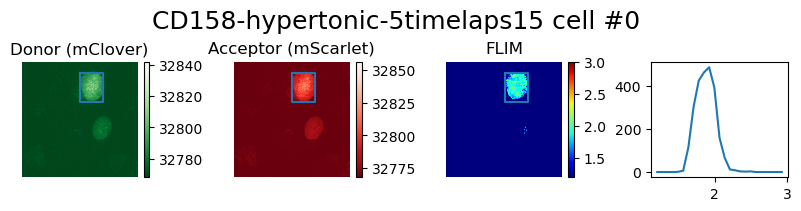

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


40


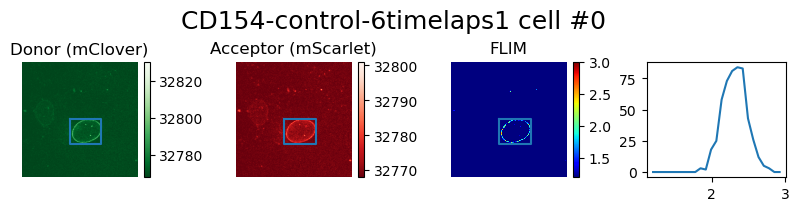

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


41


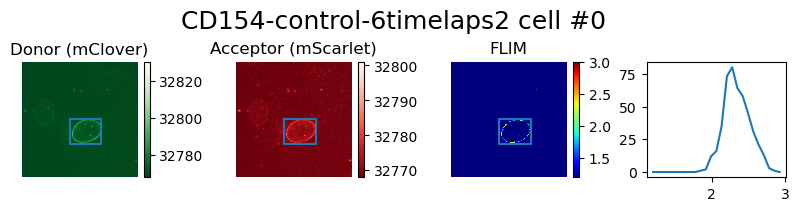

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


42


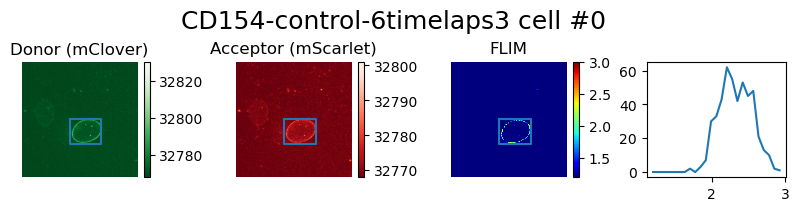

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


43


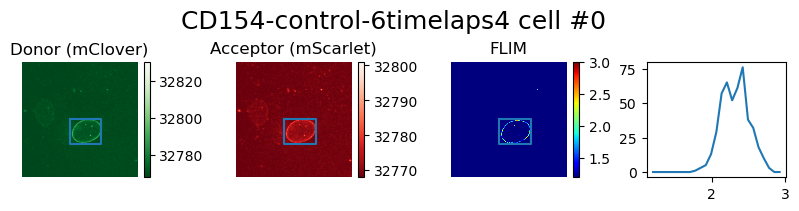

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


44


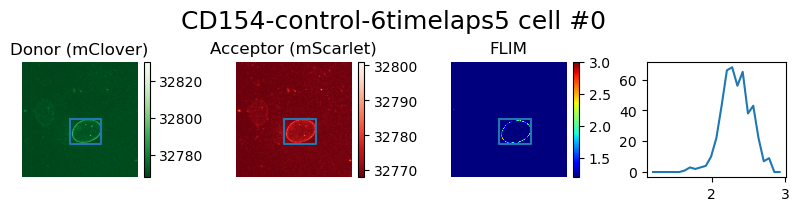

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


45


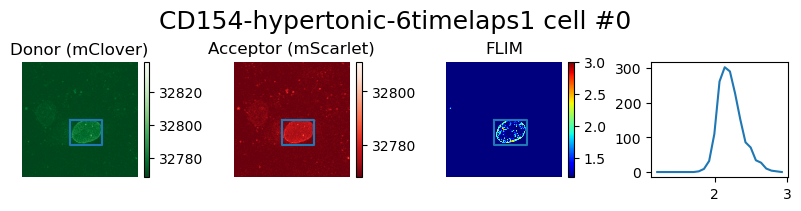

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


46


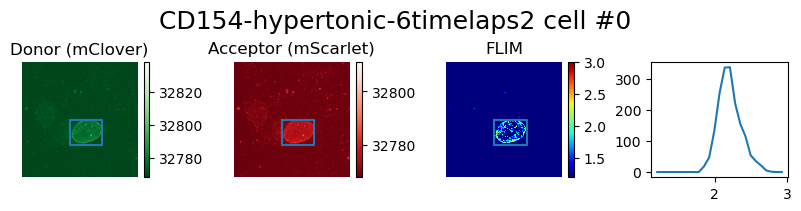

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


47


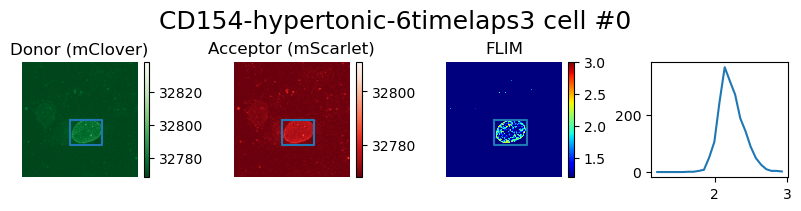

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


48


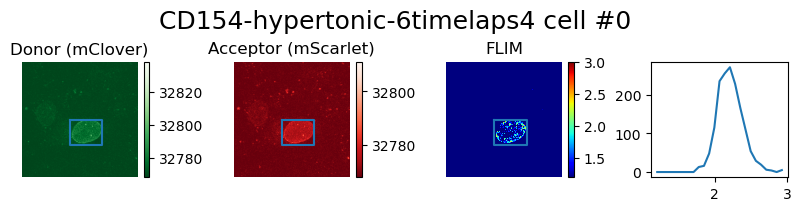

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


49


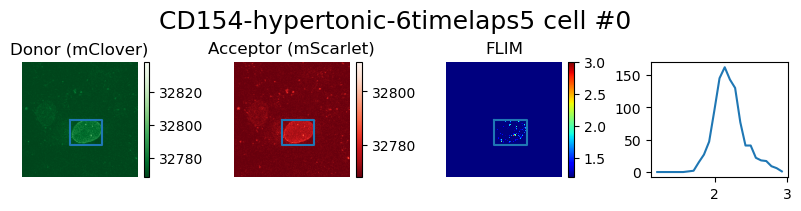

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


50


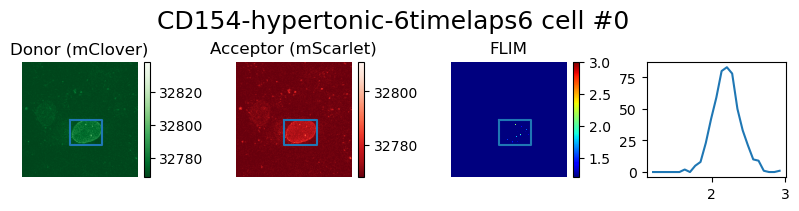

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


51


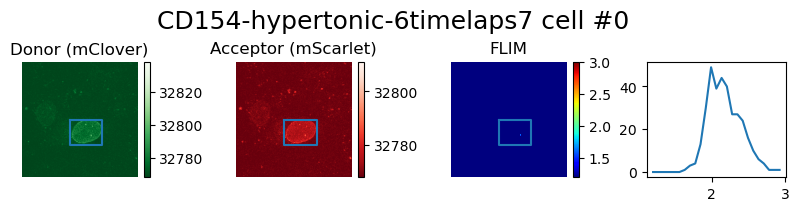

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


52


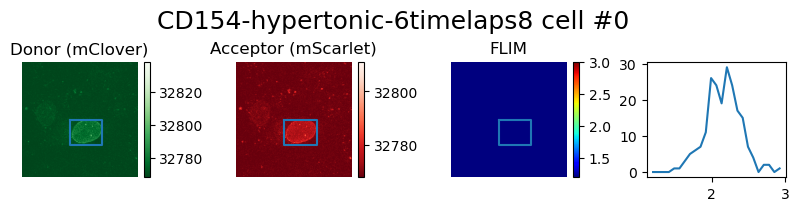

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


53


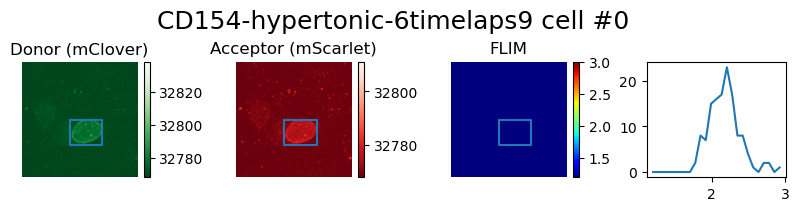

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


54


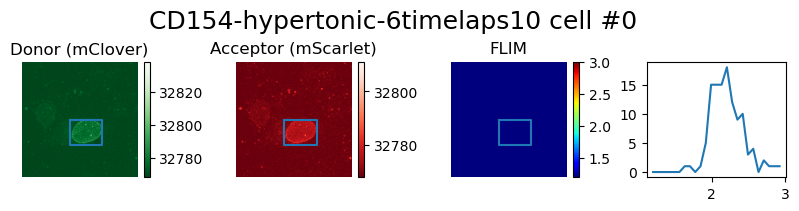

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


55


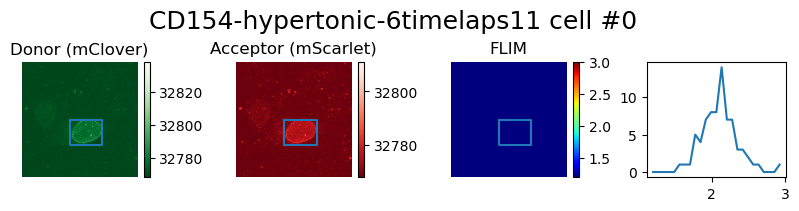

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


56


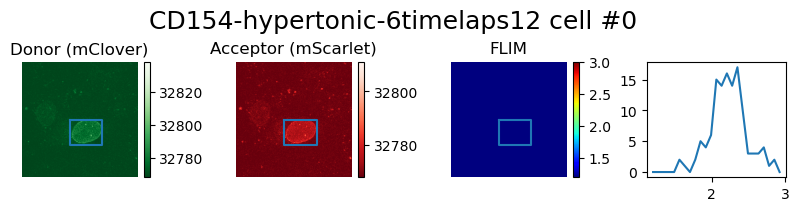

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


57


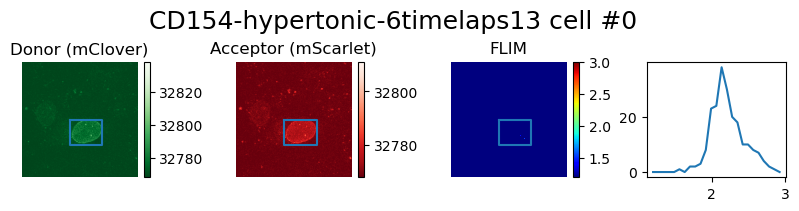

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


58


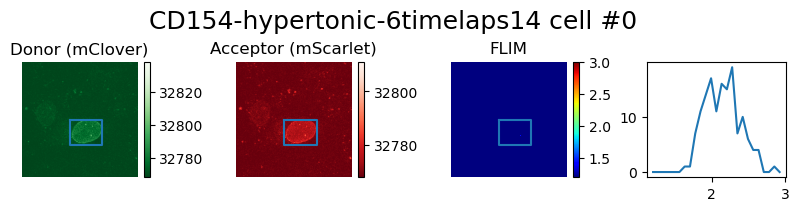

TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
TiffPage 0: TypeError: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'


59


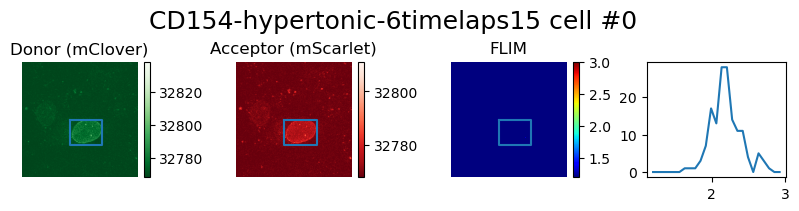

Done!


In [39]:
# open FLIM file
constructs = ['CD153','CD154','CD158']

print(len(metadata))
for i in range(len(metadata)):
    print(i)
    file = metadata['Name'][i]
    ref = metadata['ref image'][i]
    t = metadata['time / hypertonic (min)'][i]
    cell_nb = 0
    
    parts = file.split('-')
    cond = parts[0]
    
## extract images 
    
    img_FLIM = io.imread(InputFolder+'FLIMdata/'+file+'.tif').astype(float)
    img_D = io.imread(InputFolder+ref+'_Ch2.tif').astype(float)
    img_FRET = io.imread(InputFolder+ref+'_Ch1.tif').astype(float)
    
    # denoise
    filtered_D = ndimage.gaussian_filter(img_D, sigma=1.5)
    # binarize
    th = skimage.filters.threshold_otsu(filtered_D)
    mask = filtered_D > th
    
    labeled_D, count = skimage.measure.label(mask, connectivity=2,return_num=True)

    props = regionprops_table(labeled_D)
    regions=pd.DataFrame(props)


    # store the bounding boxes coordinates in an array called ROIs (size = count x 4)
    #ROIs = np.zeros((count,4))
    
    
    for p in range(count):
        h = np.zeros(b)
        minx,miny,maxx,maxy = regions.iloc[p,1:5]

        bx=(miny,maxy,maxy,miny,miny)
        by=(minx,minx,maxx,maxx,minx)
        if maxx-minx >30 and maxy-miny>30:
            ROIs.append([minx,maxx,miny,maxy])
            cell.append(cell_nb)
            reference.append(ref)
            files.append(file)
            construct.append(cond)
            time.append(t)
    
            ROI = img_FLIM[minx:maxx,miny:maxy]
            #mask2 = mask[minx:maxx,miny:maxy]
            #ROI = ROI*mask2
            
            histogram, bin_edges = np.histogram(ROI, bins=b, range=(minval, maxval))


            h = h+histogram

            fig, (ax0,ax1,ax2,ax3) = plt.subplots(nrows=1,ncols=4, figsize=(8,2), constrained_layout=True)
            flim=ax2.imshow(img_FLIM, cmap='jet',clim=(minval, maxval))
            #fig.colorbar(flim,ax=ax2, shrink=0.7)
            ax2.set_title('FLIM')
            ax2.axis('off')
            
            don=ax0.imshow(img_D, cmap='Greens_r')
            ax0.set_title('Donor (mClover)')
            ax0.axis('off')

            fret=ax1.imshow(img_FRET, cmap='Reds_r')
            ax1.set_title('Acceptor (mScarlet)')
            ax1.axis('off')
            
            
            bx=(miny,maxy,maxy,miny,miny)
            by=(minx,minx,maxx,maxx,minx)
            
            ax0.plot(bx,by)
            ax1.plot(bx,by)
            ax2.plot(bx,by)

            ax3.plot(bin_edges[0:-1], histogram)
            #plt.savefig('/Users/christine/Documents/Data/DynamoLINC/FLIM/Results/'+f+'_histo.tif')
            #plt.imshow(ROI)
            
            fig.suptitle(file+' cell #'+str(cell_nb), fontsize=18)
            fig.colorbar(flim,ax=ax2)
            fig.colorbar(don,ax=ax0)
            fig.colorbar(fret, ax=ax1)

            plt.savefig(OutputFolder+file+'_cell #'+str(cell_nb)+'_histo.tif')
            plt.savefig(OutputFolder+file+'_cell #'+str(cell_nb)+'_histo.jpg')
            plt.show()
            #plt.close()

            cell_nb=cell_nb+1
            
            flatten = ROI.flatten()
            tau_mean.append(np.mean(flatten[flatten!=0]))
            tau_std.append(np.std(flatten[flatten!=0]))

print('Done!')




In [40]:
file = metadata['Name'][1]
ref = metadata['ref image'][i]
t = metadata['time / hypertonic (min)'][25]
t

1

In [41]:
df = pd.DataFrame()
df['Name'] = files[:]
df['reference image'] = reference[:]
df['Construct'] = construct[:]
df['Cell#'] = cell[:]
df['ROI coordinates'] = ROIs[:]
df['Time after hypertonic shock (min)'] = time[:]
df['Mean FLIM (ns)'] = tau_mean[:]
df['FLIM std (ns)'] = tau_std[:]

df

,Name,reference image,Construct,Cell#,ROI coordinates,Time after hypertonic shock (min),Mean FLIM (ns),FLIM std (ns)
0,CD153-control-2,CD153-control-2,CD153,0,"[71, 138, 148, 196]",-54,2.564351,0.097278
1,CD153-control-3,CD153-control-3,CD153,0,"[124, 187, 35, 121]",-48,2.513253,0.077023
2,CD153-control-3,CD153-control-3,CD153,1,"[188, 256, 82, 178]",-48,2.541243,0.068802
3,CD153-control-4,CD153-control-4,CD153,0,"[87, 167, 55, 145]",-42,2.537484,0.168441
4,CD153-control-5,CD153-control-5,CD153,0,"[6, 65, 135, 213]",-36,2.621487,0.101507
...,...,...,...,...,...,...,...,...
142,CD154-hypertonic-6timelaps11,CD154-hypertonic-6timelaps1,CD154,0,"[128, 183, 106, 178]",11,2.153479,0.255175
143,CD154-hypertonic-6timelaps12,CD154-hypertonic-6timelaps1,CD154,0,"[128, 183, 106, 178]",12,2.263790,0.244835
144,CD154-hypertonic-6timelaps13,CD154-hypertonic-6timelaps1,CD154,0,"[128, 183, 106, 178]",13,2.252061,0.221708
145,CD154-hypertonic-6timelaps14,CD154-hypertonic-6timelaps1,CD154,0,"[128, 183, 106, 178]",14,2.184297,0.232799


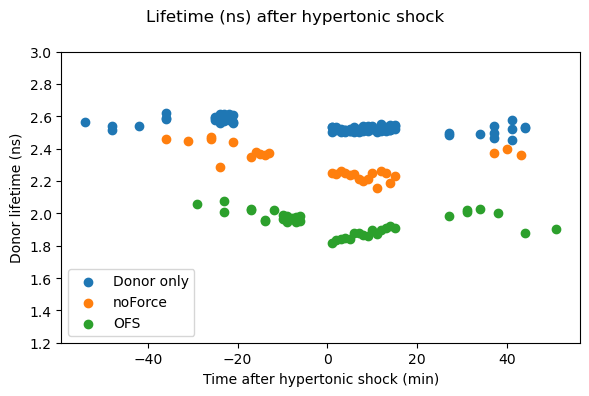

In [44]:
cdts = ['Donor only','noForce','OFS']
constructs = ['CD153','CD154','CD158']

fig, ax = plt.subplots(figsize=(6,4),tight_layout=True)
fig.suptitle('Lifetime (ns) after hypertonic shock')
ax.set_ylim([minval,maxval])
ax.set_ylabel('Donor lifetime (ns)')
ax.set_xlabel('Time after hypertonic shock (min)')


for i in range(len(constructs)):
    c = constructs[i]
    dfc = df[df['Construct']==c]
    ax.scatter(dfc['Time after hypertonic shock (min)'][:],dfc['Mean FLIM (ns)'][:], label=cdts[i])
    
ax.legend()

plt.savefig(OutputFolder+date+'_kinetics.tif')
plt.savefig(OutputFolder+date+'_kinetics.jpg')

plt.show()
    
    